# RNA–protein dynamics and perturbation analysis in HSPCs

This tutorial follows the HSPC 31800 example from reconstructed RNA–protein dynamics to a focused MkP perturbation analysis. The goal is to show how a reader can reuse MOFI outputs for a new marker set or lineage question.

Long internal acceptance checks have been kept out of the tutorial. The notebook exposes the analysis choices that matter biologically: source cells, target genes, perturbation scores, and displayed cell types.


## Workflow

1. Load the fitted RNA–protein example and reconstruct dense-time states.
2. Display observed and interpolated time slices.
3. Perturb the MkP program and plot selected trajectories.
4. Summarize fate changes and the ITGA2B–CD41 response.
5. Export a compact cross-modality transformation table.


In [ ]:
from pathlib import Path
import json

from mofi_notebook import setup_notebook, suppress_live_plot_output

# Run Jupyter from the repository root. The helper selects CUDA when available.
ROOT, DEVICE, _ = setup_notebook()
print(f"Repository: {ROOT}")
print(f"Device: {DEVICE}")


## 1. Reconstruct dense-time RNA–protein states


In [ ]:
from CytoBridge.reproducibility import require_paper_data, run_real_downstream

DATASET = "hspc_31800"
paths = require_paper_data(DATASET, ROOT)
paper_output = ROOT / "results" / "figure_4_paper"

with suppress_live_plot_output():
    downstream = run_real_downstream(
        DATASET,
        output_dir=paper_output,
        selected_figures=[],
        device=DEVICE,
        sample_max_cells=None,
        reuse_cache=True,
        repo_root=ROOT,
    )
run_dir = Path(downstream["run_dir"])
run_dir


## 2. Visualize observed and interpolated time slices

The same helper can be reused after changing the dataset configuration. It reads the time grid, embeddings, labels, and output location from one resolved YAML file.


In [ ]:
from CytoBridge.manuscript import render_hspc_time_slices
from CytoBridge.reproducibility import write_resolved_analysis_config

local_cfg = write_resolved_analysis_config(
    DATASET,
    output_dir=paper_output,
    config_path=ROOT / "results" / "figure4_resolved.yaml",
    device=DEVICE,
    repo_root=ROOT,
)
time_slice_dir = render_hspc_time_slices(
    config_path=local_cfg,
    output_dir=run_dir / "figures" / "time_slices",
    repo_root=ROOT,
)
time_slice_dir


In [ ]:
from mofi_notebook import show_paper_panel
show_paper_panel(run_dir / "figures" / "time_slices" / "time_slice_panels.png")


## 3. Prepare a reusable perturbation context

`TFRunContext` loads the trained dynamics object and cross-modality map once. The index CSV selects the same source cells across perturbation scores, while the two saved UMAP models keep RNA and protein panels in stable coordinate systems.


In [ ]:
import shutil
from CytoBridge.pl.tf.context import TFRunContext

ctx = TFRunContext.from_run_dir(run_dir)
trajectory_index_csv = ROOT / "configs" / "analysis_inputs" / "hspc_mkp_paper8_indices.csv"
trajectory_dir = run_dir / "figures" / "tf" / "paper_mkp_trajectory"
trajectory_dir.mkdir(parents=True, exist_ok=True)

shutil.copy2(
    ROOT / "paper_data" / "umap" / DATASET / "perturb_primary.pkl",
    trajectory_dir / "umap_model_primary.pkl",
)
shutil.copy2(
    ROOT / "paper_data" / "umap" / DATASET / "perturb_secondary.pkl",
    trajectory_dir / "umap_model_secondary.pkl",
)


## 4. Perturb the MkP program

Negative, zero, and positive scores show how reducing or increasing the selected program changes predicted RNA trajectories. To study another program, replace `indices_csv`, `scores`, and the target definition in the perturbation configuration.


In [ ]:
from CytoBridge.pl.tf.perturb import plot_perturbation_trajectories

with suppress_live_plot_output():
    perturb_trajectories = plot_perturbation_trajectories(
        ctx,
        indices_csv=str(trajectory_index_csv),
        scores=[-40, 0, 40],
        sample_n=8,
        seed=42,
        device=DEVICE,
        output_dir=str(trajectory_dir),
        dim_reduction="umap",
        modalities=("primary",),
    )
perturb_trajectories


### Reduced MkP program (z = -40)


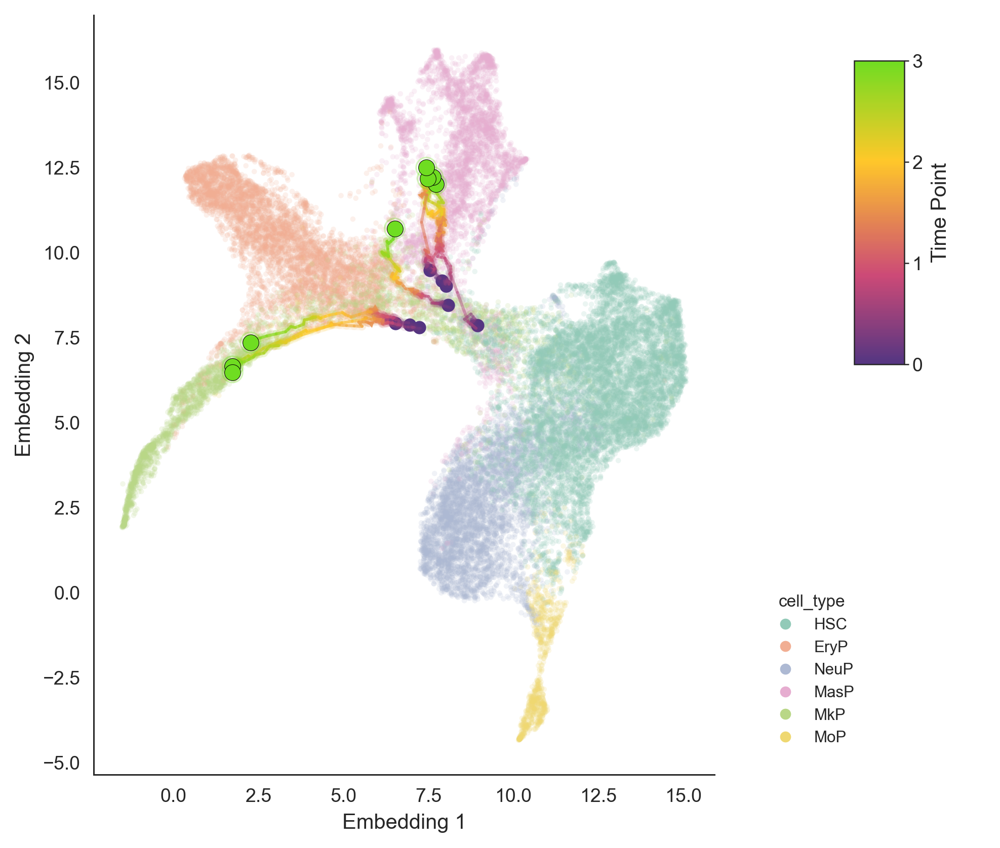

In [ ]:
from mofi_notebook import show_paper_panel
show_paper_panel(run_dir / "figures" / "tf" / "paper_mkp_trajectory" / "perturb_index_traj_primary__g-mk-union__z-m40__dr-umap.png")


### Unperturbed reference (z = 0)


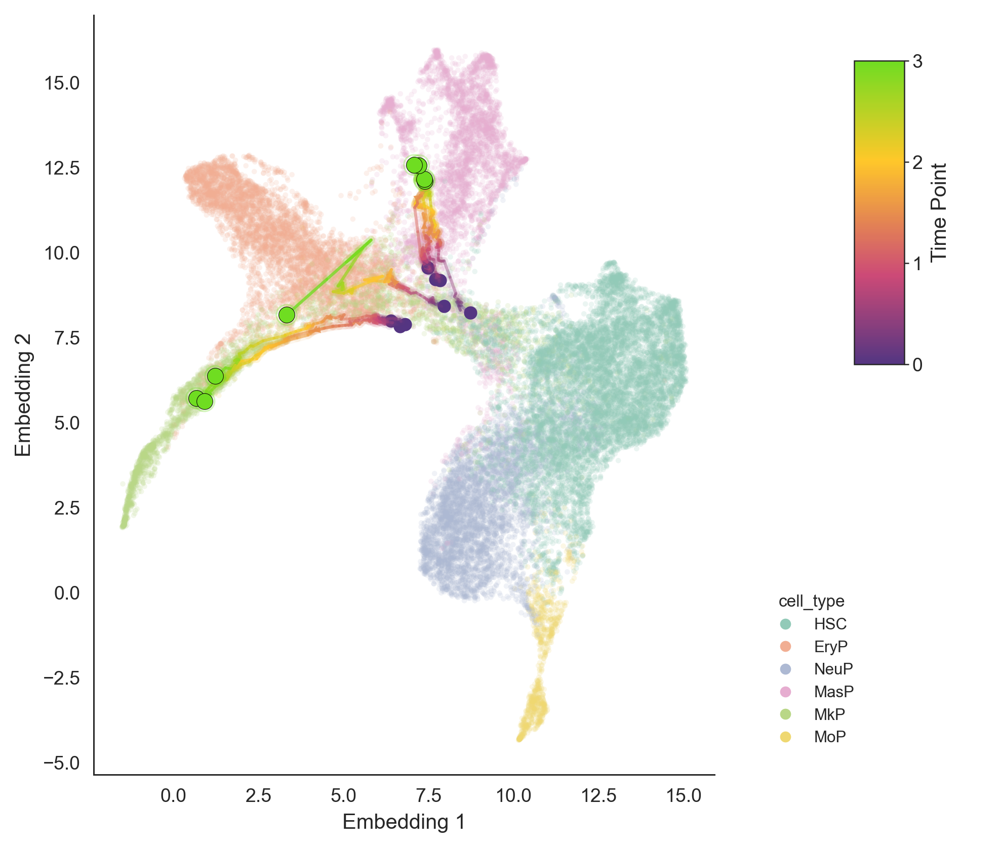

In [ ]:
from mofi_notebook import show_paper_panel
show_paper_panel(run_dir / "figures" / "tf" / "paper_mkp_trajectory" / "perturb_index_traj_primary__g-mk-union__z-0__dr-umap.png")


### Increased MkP program (z = 40)


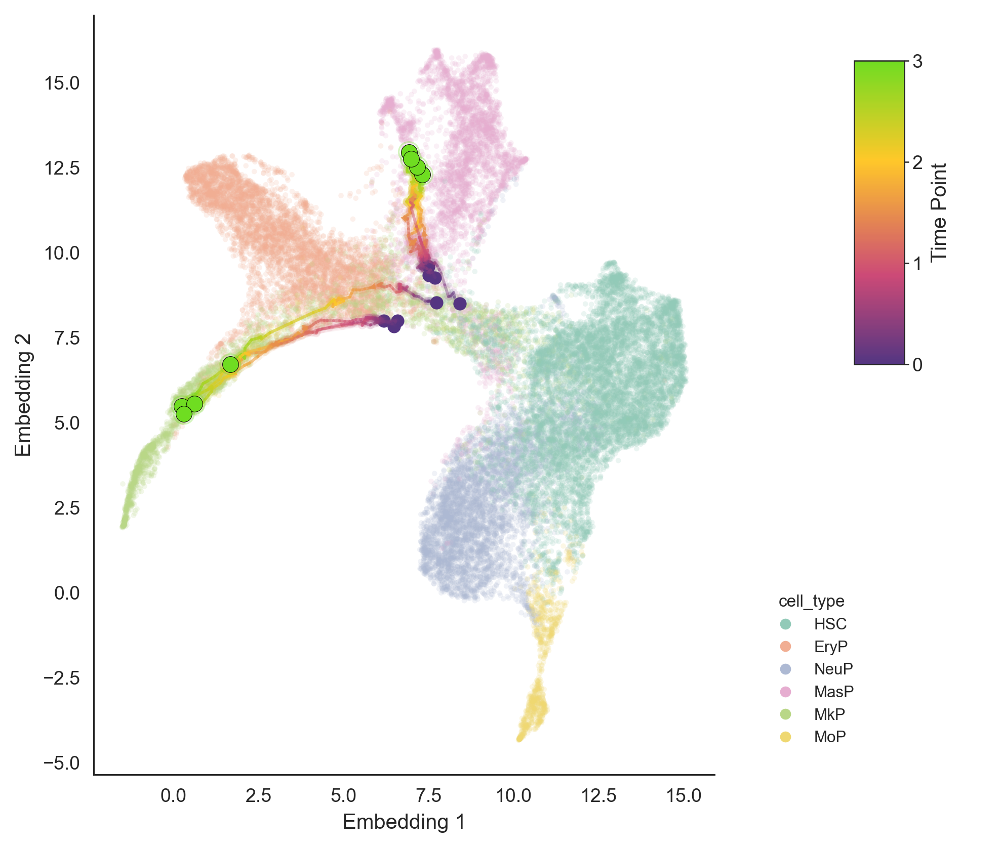

In [ ]:
from mofi_notebook import show_paper_panel
show_paper_panel(run_dir / "figures" / "tf" / "paper_mkp_trajectory" / "perturb_index_traj_primary__g-mk-union__z-40__dr-umap.png")


## 5. Run marker-level perturbation analysis

The YAML file defines the MkP target genes and the paired RNA–protein tasks. The output tables are reusable: plotting functions consume the saved CSV files rather than recomputing trajectories.


In [ ]:
import yaml
from CytoBridge.pl.tf.perturb_pipeline import run_perturbation_pipeline_for_run

with (ROOT / "configs" / "perturbation" / "hspc_31800_primary.yaml").open(encoding="utf-8") as stream:
    perturb_cfg = yaml.safe_load(stream)["perturb_pipeline"]

fate_index_csv = ROOT / "configs" / "analysis_inputs" / "hspc_final_mkp_indices.csv"
perturb_cfg.update(
    indices_csv=str(fate_index_csv),
    use_indices_csv=True,
    device=DEVICE,
    target_group="Mk_union",
    output_table_dir=str(run_dir / "tables" / "tf" / "paper_primary"),
    output_figure_dir=str(run_dir / "figures" / "tf" / "paper_primary"),
)
if "fate_sweep" in perturb_cfg:
    perturb_cfg["fate_sweep"]["enabled"] = False

with suppress_live_plot_output():
    perturb = run_perturbation_pipeline_for_run(str(run_dir), cfg=perturb_cfg)
perturb["manifest_json"]


## 6. Summarize predicted fate composition

Here every selected source cell is propagated at nine perturbation scores. The heatmap reports the change in terminal cell-type composition relative to the unperturbed prediction.


In [ ]:
from CytoBridge.pl.tf.perturb import build_perturbation_fate_sweep

with suppress_live_plot_output():
    fate = build_perturbation_fate_sweep(
        ctx,
        target_group="Mk_union",
        target_genes=["ITGA2B", "GP1BA", "PF4", "PPBP"],
        scores=[-40, -30, -20, -10, 0, 10, 20, 30, 40],
        sample_n="all",
        seed=42,
        device=DEVICE,
        output_table_dir=str(run_dir / "tables" / "tf" / "paper_mkp_fate"),
        output_figure_dir=str(run_dir / "figures" / "tf" / "paper_mkp_fate"),
        sweep_cell_types=["EryP", "HSC", "MasP", "MkP", "MoP", "NeuP"],
        focus_curve_cell_types=["EryP", "HSC", "MasP", "MkP", "MoP", "NeuP"],
        focus_curve_scores=[-40, 0, 40],
        heatmap_z_order=[-40, -30, -20, -10, 0, 10, 20, 30, 40],
        heatmap_orientation="z_by_cell_type",
        heatmap_cell_type_order=["HSC", "MoP", "MasP", "NeuP", "MkP", "EryP"],
        heatmap_vmax_percent=40,
        prob_heatmap_value_col="delta_rate",
    )
fate


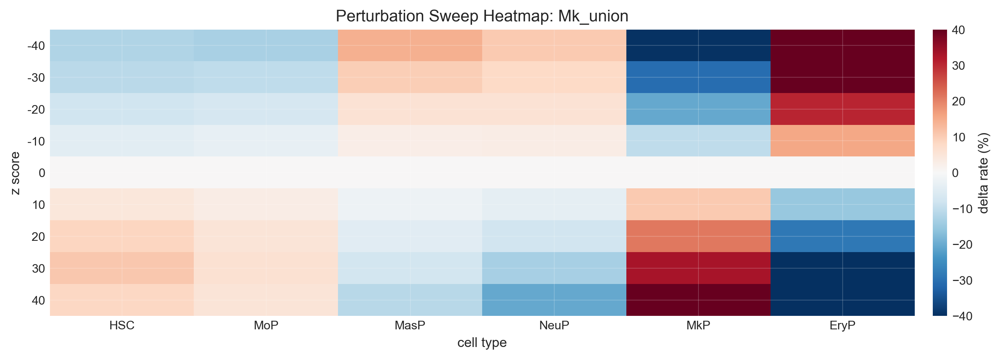

In [ ]:
from mofi_notebook import show_paper_panel
show_paper_panel(run_dir / "figures" / "tf" / "paper_mkp_fate" / "perturbation_sweep_heatmap_prob.png")


## 7. Plot the ITGA2B–CD41 response

This plot reads the CSV tables produced by the perturbation pipeline. The same function can plot any paired primary/secondary variables present in a saved task directory.


In [ ]:
from CytoBridge.pl.tf.perturb_pipeline import plot_saved_perturbation_batch_curves

endpoint_table_dir = (
    run_dir / "tables" / "tf" / "paper_primary" / "primary" / "batch" / "a_itga2b_cd41"
)
with suppress_live_plot_output():
    itga2b_curve = plot_saved_perturbation_batch_curves(
        endpoint_table_dir,
        run_dir / "figures" / "tf" / "paper_primary" / "primary" / "batch" /
        "perturb_batch_curve__task-a-itga2b-cd41__allz.png",
        scores=[-40, -20, 0, 20, 40],
        primary_var="ITGA2B",
        secondary_var="CD41",
        title_suffix="ITGA2B → CD41",
    )
itga2b_curve


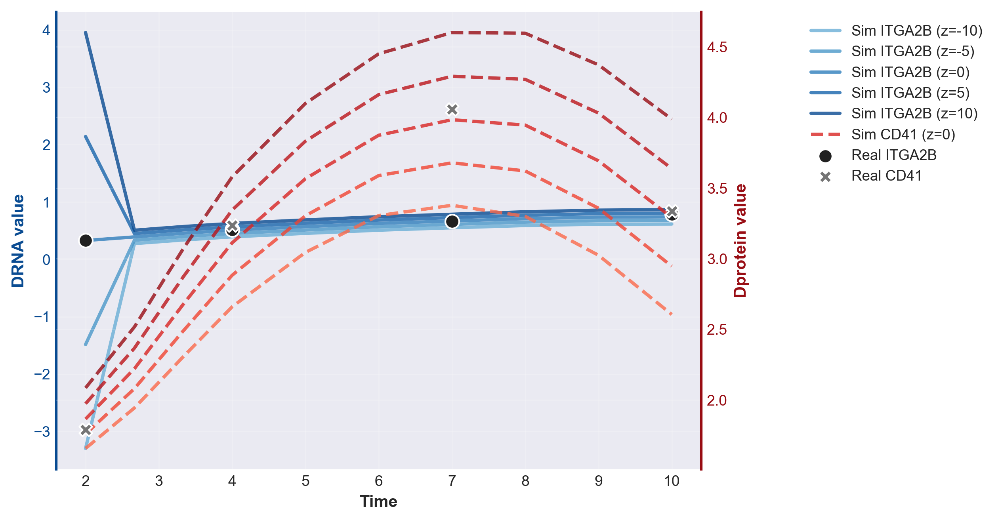

In [ ]:
from mofi_notebook import show_paper_panel
show_paper_panel(itga2b_curve)


## 8. Export a cross-modality transformation table

The transformation analysis estimates how local RNA-space directions map to protein-space directions and vice versa. The compact table is often easier to reuse than a manuscript-specific panel.


In [ ]:
from CytoBridge.pl.tf.regulation_umap import build_regulation_umap_outputs
from CytoBridge.manuscript import build_transformation_summary

with suppress_live_plot_output():
    transformation = build_regulation_umap_outputs(
        ctx=ctx,
        out_fig_dir=run_dir / "figures" / "tf" / "transformation",
        cfg_obj={"device": DEVICE, "regulation_umap": {
            "enabled": True,
            "obs_key": "cell_type",
            "obs_value": "MasP",
            "celltype_time_scope": "all_times",
            "seed": 42,
            "device": DEVICE,
            "max_selected_cells": 256,
            "mapper_batch_size": 128,
            "include_hessian_term": False,
            "umap_neighbors": 10,
            "umap_min_dist": 0.1,
            "umap_seed": 42,
        }},
    )

transformation_csv = run_dir / "tables" / "tf" / "transformation" / "transformation_summary.csv"
transformation_summary = build_transformation_summary(
    transformation,
    selected_csv=ROOT / "configs" / "analysis_inputs" / "hspc_transformation_genes.csv",
    output_csv=transformation_csv,
    repo_root=ROOT,
)
transformation_summary


## Apply the workflow to your own data

The figure-specific helpers above keep the paper example concise, but the reusable workflow is the same for another RNA–protein dataset:

1. Put time labels and cell-type labels in `adata.obs`.
2. Preprocess each modality with `CytoBridge.pp.preprocess`.
3. Train the dynamics model with `CytoBridge.tl.fit` and save the returned `AnnData` object.
4. Fit or load the cross-modality map.
5. Reuse the plotting calls shown above with your own paths, marker names, perturbation targets, and time points.

```python
import scanpy as sc
import CytoBridge as cb

adata = sc.read_h5ad("my_data.h5ad")
adata = cb.pp.preprocess(
    adata,
    time_key="time",
    dim_reduction="PCA",
    normalization=True,
    log1p=True,
    select_hvg=True,
)
adata = cb.tl.fit(adata, config="ruot", device=DEVICE)
adata.write_h5ad("my_data_with_mofi_model.h5ad")
```

Start by changing only the input paths and metadata keys. Once that run works, change biological choices such as markers, source populations, perturbation scores, or displayed cell types.
